In [1]:
pip install praw

Note: you may need to restart the kernel to use updated packages.


In [2]:
import praw
import datetime
import pandas as pd
import matplotlib.pyplot as plt


/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [3]:
# Required Libraries

#Base and Cleaning 
import json
import numpy as np
import string
from collections import Counter

#Visualizations
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt 
import pyLDAvis.gensim
import chart_studio
import chart_studio.plotly as py 
import chart_studio.tools as tls

#Natural Language Processing (NLP)

import gensim
from gensim.corpora import Dictionary
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from pprint import pprint

from nltk.stem.snowball import SnowballStemmer
from tqdm import tqdm
from collections import OrderedDict
from collections import defaultdict
from collections import namedtuple
import numpy as np
from nltk.stem import PorterStemmer
from nltk.tokenize import WhitespaceTokenizer
import nltk
import random
from math import lgamma
from sklearn import linear_model
import datetime

import re
import string
import os
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from collections import defaultdict, Counter
from nltk.corpus import wordnet




In [4]:
reddit = praw.Reddit(
   client_id = 'b4XYaz4x0PqoZBU5BK0xzw',
   client_secret = 'Fxb9VyUszBmb0ATBp-spCKt3QIEHmA',
   user_agent = 'Digita'
)

subreddit_name = 'linguistics'
subreddit = reddit.subreddit(subreddit_name)

In [5]:
search_queries = ['minority language', 'linguistic minority', 'endangerment','language shift','maintenance','marginalized', 'culture','extinguishing language','less spoken language']
data = []
for query in search_queries:
    posts = subreddit.search(query, limit=None)
    for post in posts:
        # Extract post details
        post_data = {
            "Type": "Post",
            "Title": post.title,
            "Score": post.score,
            "Post_ID": post.id,
            "Text": post.selftext,
            "URL": post.url,
            "Created_UTC": datetime.datetime.utcfromtimestamp(post.created_utc).isoformat(),
            "Parent_ID": None,
            "Comment_ID": None,
            "Poster_ID": post.author.name if post.author else "[deleted]"
        }
        data.append(post_data)
        
        # Extract comments
        post.comments.replace_more(limit=None)
        for comment in post.comments.list():
            comment_data = {
                "Type": "Comment",
                "Title": None,
                "Score": comment.score,
                "Post_ID": post.id,
                "Text": comment.body,
                "URL": None,
                "Created_UTC": datetime.datetime.utcfromtimestamp(comment.created_utc).isoformat(),
                "Parent_ID": comment.parent_id,
                "Comment_ID": comment.id,
                "Poster_ID": comment.author.name if comment.author else "[deleted]"
            }
            data.append(comment_data)
            
# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data)

# Combine "Title" and "Text"
df['Text_all'] = df.apply(lambda row: (row['Title'] + ' ' if row['Title'] else '') + row['Text'], axis=1)

# Display the DataFrame
print(df)   


          Type                                              Title  Score  \
0         Post  Do minority languages need machine translation...     45   
1      Comment                                               None     42   
2      Comment                                               None      4   
3      Comment                                               None      2   
4      Comment                                               None      1   
...        ...                                                ...    ...   
29984  Comment                                               None      2   
29985  Comment                                               None      3   
29986  Comment                                               None      3   
29987  Comment                                               None      2   
29988  Comment                                               None      1   

       Post_ID                                               Text  \
0      1dqgmu4    

In [6]:
df

,Type,Title,Score,Post_ID,Text,URL,Created_UTC,Parent_ID,Comment_ID,Poster_ID,Text_all
0,Post,Do minority languages need machine translation...,45,1dqgmu4,,https://www.lexiconista.com/minority-languages...,2024-06-28T10:40:33,None,None,galaxyrocker,Do minority languages need machine translation...
1,Comment,None,42,1dqgmu4,"This is relevant even today, where Google just...",None,2024-06-28T10:41:51,t3_1dqgmu4,lanssnd,galaxyrocker,"This is relevant even today, where Google just..."
2,Comment,None,4,1dqgmu4,Well trained translation technology for Irish ...,None,2024-06-29T16:16:27,t3_1dqgmu4,laun2o2,caoluisce,Well trained translation technology for Irish ...
3,Comment,None,2,1dqgmu4,Do minority languages need machine translation...,None,2024-08-01T19:10:44,t3_1dqgmu4,lg0spz0,NotAnybodysName,Do minority languages need machine translation...
4,Comment,None,1,1dqgmu4,All posts must be links to academic articles a...,None,2024-06-28T10:40:34,t3_1dqgmu4,lanso3n,AutoModerator,All posts must be links to academic articles a...
...,...,...,...,...,...,...,...,...,...,...,...
29984,Comment,None,2,r4wwt,The success of the Soviet language policy was ...,None,2012-03-20T19:06:41,t3_r4wwt,c431uah,[deleted],The success of the Soviet language policy was ...
29985,Comment,None,3,r4wwt,I hear about these diglossia situations (e.g. ...,None,2012-03-20T21:35:09,t1_c42xkp4,c433rjb,Erasmus92,I hear about these diglossia situations (e.g. ...
29986,Comment,None,3,r4wwt,"Please don't edit away ""sauces""",None,2012-03-21T21:57:06,t1_c42zsmi,c43i10x,murtly,"Please don't edit away ""sauces"""
29987,Comment,None,2,r4wwt,Considering some of the people arguing for vow...,None,2012-03-22T10:49:02,t1_c431uah,c43opwg,Bliumchik,Considering some of the people arguing for vow...


In [7]:
df.to_csv("/Users/nadira/Desktop/Linguistics.csv", index=False)

In [8]:
df=pd.read_csv('Linguistics.csv')

## Preprocessing

In [9]:
import nltk
nltk.download('averaged_perceptron_tagger')



[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/nadira/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [10]:
pip install transformers

Note: you may need to restart the kernel to use updated packages.


In [11]:
from transformers import BertTokenizer

In [12]:
class Preprocessor:
    def __init__(self):
        self.stop_words = set(stopwords.words('english'))
        self.stemmer = PorterStemmer()
        self.lemmatizer = WordNetLemmatizer()
        self.tag_map = defaultdict(lambda: wordnet.NOUN)
        self.tag_map.update({
            'J': wordnet.ADJ,
            'V': wordnet.VERB,
            'R': wordnet.ADV
        })
        self.meaningless_patterns = re.compile(r"['’’“”‘’]\b\w?_['“”‘’]?\w?\b")
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

    def tokenize(self, text):
        tokens = self.tokenizer.tokenize(text)
        return tokens

    def preprocess(self, text):
        text = self.lowercase(text)
        text = self.replace_numbers(text)
        text = self.remove_whitespace(text)
        text = self.remove_stopwords(text)
        text = self.remove_punctuation(text)
        text = self.remove_meaningless_words(text)
        text = self.lemmatize(text)
        return text
    
    def remove_tags(self, text):
        return re.sub(r'@\w+ ', '', text)

    def lowercase(self, text):
        return text.lower()

    def remove_numbers(self, text):
        return re.sub(r'\d+', '', text)

    def remove_whitespace(self, text):
        return re.sub(r'\s+', ' ', text).strip()

    def remove_stopwords(self, text):
        return ' '.join([word for word in text.split() if word not in self.stop_words])

    def remove_punctuation(self, text):
        return text.translate(str.maketrans('', '', string.punctuation))

    def remove_meaningless_words(self, text):
        return ' '.join([word for word in text.split() if not self.meaningless_patterns.match(word)])

    def stem(self, text):
        tokens = word_tokenize(text)
        return ' '.join([self.stemmer.stem(token) for token in tokens])
    def replace_numbers(self, text):
        return re.sub(r'\d+', '#', text)

    def lemmatize(self, text):
        tokens = word_tokenize(text)
        pos_tags = pos_tag(tokens)
        return ' '.join([self.lemmatizer.lemmatize(token, self.tag_map[tag[0]]) for token, tag in pos_tags])

    def unigrams(self, text):
        tokens = self.tokenizer.tokenize(text)
        return [token for token in tokens if len(token) > 1 or self.is_emoji(token)]

    def is_emoji(self, s):
        emoji_ranges = [
            (0x1F600, 0x1F64F),  # emoticons
            (0x1F300, 0x1F5FF),  # symbols & pictographs
            (0x1F680, 0x1F6FF),  # transport & map symbols
            (0x1F700, 0x1F77F)   # alchemical symbols
        ]
        return any(start <= ord(s) <= end for start, end in emoji_ranges)

    def bigrams(self, doc):
        cleaned_doc = [token for token in doc if len(token) > 1 or self.is_emoji(token)]
        return ["_".join(bigram) for bigram in list(nltk.bigrams(cleaned_doc))]


    def tokenize_text(self, text):
        return word_tokenize(text)

    def preprocess_column(self, df, column_name):
        tqdm.pandas(desc="Processing")
        lemmatized_column_name = f'lemma_{column_name}'
        unigrams_column_name = f'unigrams_{column_name}'
        bigrams_column_name = f'bigrams_{column_name}'
        tokenized_column_name = f'tokenized_{lemmatized_column_name}'

        # Add lemmatized column
        df[lemmatized_column_name] = df[column_name].progress_apply(self.preprocess)

        # Add unigrams column
        df[unigrams_column_name] = df[lemmatized_column_name].progress_apply(self.unigrams)

        # Add tokenized column for lemmatized text
        df[tokenized_column_name] = df[lemmatized_column_name].progress_apply(self.tokenize_text)
        

        return df


In [13]:
df.fillna('',inplace=True)
preprocessor=Preprocessor()

df1=preprocessor.preprocess_column(df,'Text_all')

/Users/nadira/anaconda3/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Processing: 100%|██████████████████████| 30039/30039 [00:02<00:00, 12454.04it/s]


## Get the list of languages using Python Pycountry package

In [14]:
!pip install pycountry


In [15]:
import pycountry
lang_list=[]
# List all languages
languages = list(pycountry.languages)
for language in languages:  
    lang_list.append(language.name)
    print(lang_list)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [16]:
# Create a list to hold language data
lang_list = []

# Loop through all languages in pycountry
for language in pycountry.languages:
    # Get the name 
    language_name = getattr(language, 'name', 'Unknown')
    # Add the data to the list
    lang_list.append({'Name': language_name})

# Create Dataframe for languages 
lang_df = pd.DataFrame(lang_list)
print(lang_df)


                    Name
0                 Ghotuo
1             Alumu-Tesu
2                    Ari
3                   Amal
4     Arbëreshë Albanian
...                  ...
7905     Youjiang Zhuang
7906      Yongnan Zhuang
7907          Zyphe Chin
7908                Zaza
7909     Zuojiang Zhuang

[7910 rows x 1 columns]


In [17]:
# Check the mentioned languages in the text of dataframe
Mentioned_language = []
for text in df1['tokenized_lemma_Text_all']:
    for language in lang_df['Name']:
        if language.lower() in text: 
            Mentioned_language.append(language)
            break  
Mentioned_language = list(set(Mentioned_language))


In [18]:
# Remove Duplicates
Mentioned_language = list(set(Mentioned_language))

len(Mentioned_language)

447

/Users/nadira/anaconda3/lib/python3.11/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


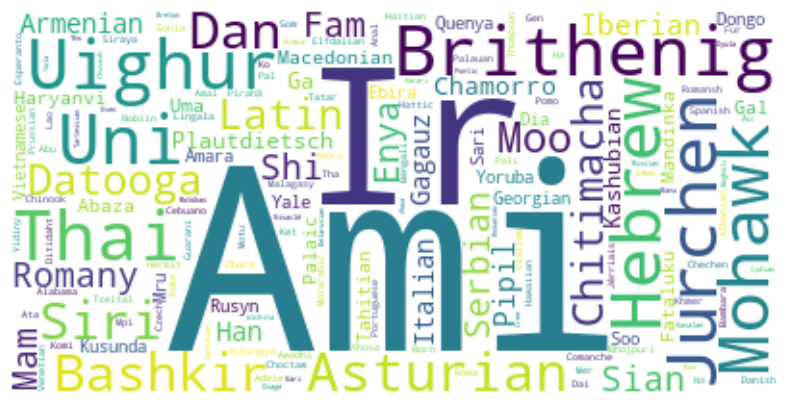

In [19]:
# Print Wordcloud
from wordcloud import WordCloud

lan_wordcloud = WordCloud(background_color="white", width=400).generate(" ".join(Mentioned_language))

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(lan_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [20]:
lan_wordcloud.to_file('/Users/nadira/Desktop/Lang_wordcloud.png')


In [21]:
Mentioned_languages = []

for text in df1['Text_all']:
    for language in lang_df['Name']:
        if language in text: 
            Mentioned_languages.append((language, text))  
            print(f"Found language '{language}' in: {text}")
            break  
            
# Remove duplicates (if any) from the list
Mentioned_languages = list(set(Mentioned_languages))


Found language 'Manx' in: This is relevant even today, where Google just released 100+ new languages with translations...that are often quite wrong. For instance, the Manx translation translates 'hello' to the word for 'music'. I'm very much of the opinion that this does more harm than good to minority languages, much like the Scots Wiki debacle.
Found language 'As' in: Well trained translation technology for Irish is fairly good, when trained on high quality data. It has its uses for professional translators who deal with a big volume of text - obviously with the caveat that the person using it is able to properly post-edit, like you said. 

The airport signage was probably more a case of piss-poor Irish language policy by Dublin Airport, which is nothing new. Plenty of companies have good Irish language translation or bilingual signage. The reality is probably that some people will always just overestimate the capabilities of machine translation (usually non-linguists) but I don’t th

In [22]:
# Get the DataFrame with text info for correspondent language
results = []
for language, text in Mentioned_languages:
    results.append({'Language': language, 'Text': text})

match_lan_df = pd.DataFrame(results)
print(match_lan_df)


      Language                                               Text
0          Che  Thanks for your input, I think that's a reason...
1            E  It was given a nod in this [pretty funny super...
2           Hu                                  Huh. Interesting.
3          Lou  I’ve seen this video before! It was a surprise...
4            E  How didn't I think of this! Thank you, I'll lo...
...        ...                                                ...
17453       Ge  Japanese has a couple. There’s “What happens t...
17454       Tu  I also found this paper explaining the correla...
17455      Som  Well like you said the language is often a ref...
17456        E  * Out of college, I did English conversation i...
17457   German  Layman here.\n\nThere are words containing /ʊŋ...

[17458 rows x 2 columns]


### Apply Keyword Expansion with Current Search_queries

In [23]:
# Define 4 lists 
reference_words_seed=["shift"]
reference_words_expanded=["loss","endangerment","transmission","change"]
reference_words_excluded=["new language"]
reference_words_excluded_expanded=[]

In [24]:
# Put the seed words and keywords added through discovery together

reference_words=reference_words_seed+reference_words_expanded
reference_words="|".join(reference_words)

reference_words_excluded=reference_words_excluded+reference_words_excluded_expanded
reference_words_excluded="|".join(reference_words_excluded)

In [25]:
df['includes']=df1['Text_all'].str.contains(pat=reference_words,regex=True,case=False)
df['excludes']=df1['Text_all'].str.contains(pat=reference_words_excluded,regex=True,case=False)

In [26]:
df['reference_set'] = (df['includes']== True) & (df['excludes'] == False) #all rows with the included and without the excluded
df['reference_set'] = df['reference_set']*1

In [27]:
#Check how many texts each
df['reference_set'].value_counts()

reference_set
0    27498
1     2541
Name: count, dtype: int64

In [28]:
# Sample some texts that labelled to be about reference words 
samp = df.loc[df['reference_set']==1,'Text'].sample(10)

In [29]:
print(samp)

9246     The Mandarin recorded in rime books in the 130...
9683     I suppose that speaks to the lack of a role of...
7735     According to your view, then, languages are ju...
14761    I mean, that's interesting, but I find most of...
21346    Yeah, I was under the impression Brooklyn was ...
1642     We don't know about the future but in Cataloni...
19270    Not the most related comment, but as a Brit li...
11294    >turns a vowel into a consonant\n\nI'm not sur...
5869     [deka glossai](https://www.youtube.com/user/de...
13696    This has some places to start:\n\n\nhttps://li...
Name: Text, dtype: object


In [30]:
# Check if there are excluded words
excluded_words = len(reference_words_excluded.replace("|", "")) > 0

# Combine keywords into one string
if excluded_words:
    all_current_keywords = reference_words + "|" + reference_words_excluded
else: 
    all_current_keywords = reference_words

# Split the concatenated string into a list of keywords
keywords_list = all_current_keywords.split("|")

df['text_preprossed'] = df1['Text_all']

# Function to remove keywords from text
def remove_keywords(text, keywords):
    for keyword in keywords:
        text = text.replace(keyword, '')  # Replace each keyword with an empty string
    return text

# Apply the function to the 'text' 
df['text_preprossed'] = df1['Text_all'].apply(lambda x: remove_keywords(x, keywords_list))

print(df['text_preprossed'].head())


0    Do minority languages need machine translation...
1    This is relevant even today, where Google just...
2    Well trained translation technology for Irish ...
3    All posts must be links to academic articles a...
4    Do minority languages need machine translation...
Name: text_preprossed, dtype: object


In [31]:
tokenizer = WhitespaceTokenizer()
ps = PorterStemmer()

In [32]:
pre_prossed_sents =[]
for sent in tqdm(df['text_preprossed']):
    words = tokenizer.tokenize(sent)
    words = [re.sub(r'\d+', '', word) for word in words] #removing tokens that are only words
    words = [x for x in words if x] #removing empty strings
    sent_stem = [ps.stem(word) for word in words]

    sent_done = " ".join(sent_stem)
    pre_prossed_sents.append(sent_done)


100%|███████████████████████████████████| 30039/30039 [00:11<00:00, 2518.30it/s]


In [33]:
df['text_pre_stem'] = pre_prossed_sents

In [34]:
vectorizer = CountVectorizer(min_df = 10,
                           max_df = 0.999,
                           stop_words='english',
                          ngram_range = (1,2)) #set for larger n-grams

corpus = vectorizer.fit_transform(df['text_pre_stem'])

In [35]:
DTM_dict = {"DTM":corpus,
               "labels":list(df['reference_set'])}


In [36]:
# Determine the number of texts for the training data
n_search=min(sum(df['reference_set']==1)*2,50000)

In [37]:
# Create lists of indices, indicating which belong to the reference set and which do not
reference_ids=list(df[df['reference_set']==1].index)
search_ids = list(df[df['reference_set']==0].index)

In [38]:
#Take random sample of search indices
search_ids_sample = random.choices(search_ids, k=n_search)
ids = reference_ids + search_ids_sample # putting them together to create the full list of training set indices

# Checking amounts
print(len(reference_ids),len(search_ids_sample),len(ids))

2541 5082 7623


In [39]:
# Save the training data in a dict object 
DTM_train = {"DTM" : corpus[ids,:],
            "labels": list(df['reference_set'][ids])}

In [40]:
# Define classifier 
clf = linear_model.LogisticRegressionCV(penalty="l1", n_jobs = -1, solver = "liblinear", max_iter=10000, verbose = 1)

In [41]:
# Fit the model 
clf.fit(DTM_train['DTM'], DTM_train['labels'])

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


optimization finished, #iter = 0
Objective value = 0.422681
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 0.422681
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 0.422750
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 0.422750
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 0.422681
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 3.272667
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 3.273203
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 3.273203
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 3.272667
#nonzeros/#features = 0/13604
optimization finished, #iter = 0
Objective value = 3.272667
#nonzeros/#features = 0/13604
iter   1  #CD cycles 3
iter   1  #CD cycles 3
iter   2  #CD cycles 1
iter   2  #CD cycles 1
iter   3

[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.1s remaining:    4.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.1s finished


LogisticRegressionCV(max_iter=10000, n_jobs=-1, penalty='l1',
                     solver='liblinear', verbose=1)

In [42]:
# Make predictions on the full dataset
predictions = clf.predict(corpus)

In [43]:
np.std(predictions)

0.3930249476208384

In [44]:
threshold = 0.25

In [45]:
# Save variables so far in a dict

DTM_full = {'DTM':corpus,
            'raw_preds': predictions,
            'preds': (predictions > threshold) * 1 ,
            'reference': list(df['reference_set']==1),
            'reference_ids': reference_ids}

In [46]:
set_var = []

for i in range(0,len(DTM_full['preds'])):
    if i in reference_ids: #if the obs is in the reference group
        set_var.append('Reference')

    elif DTM_full['preds'][i] == 1:
        set_var.append('Target')

    elif DTM_full['preds'][i] == 0:
        set_var.append('Not target')

    else:
        set_var.append(None)

In [47]:
# Creating a new dataframe of predictions

pred_df = pd.DataFrame([pd.Series(DTM_full['preds']),pd.Series(set_var)]).T

In [48]:
# Check performance 
pd.crosstab(pred_df[0],pred_df[1])

1,Not target,Reference,Target
0,,,
0,24268,36,0
1,0,2505,3230


In [49]:
# Save the reference/target/non target in the dict
DTM_full['set_var'] = set_var

In [50]:
# Creating 3 lists of indices

target_ids = list(pd.Series(DTM_full['set_var']) == 'Target')
not_target_ids = list(pd.Series(DTM_full['set_var']) == 'Not target')
ref_ids = list(pd.Series(DTM_full['set_var']) == 'Reference')

In [51]:
# Creating statistics for the target, not_target and reference sets

target_freq = np.sum(DTM_full['DTM'][target_ids,:],0) #how many times is each token used in the target documents
target_num_docs = np.sum(DTM_full['DTM'][target_ids,:] > 0, axis = 0) #how many target documents does each token appear in
target_num_docs_prop =  target_num_docs / sum(target_ids) #proportion of target docs with each token


not_target_freq = np.sum(DTM_full['DTM'][not_target_ids,:],0) #how many times is each token used in the not_target documents
not_target_num_docs = np.sum(DTM_full['DTM'][not_target_ids,:]> 0,axis = 0) #how many not_target documents does each token appear in
not_target_num_docs_prop =  not_target_num_docs / sum(not_target_ids) #proportion of not_target docs with each token


ref_freq = np.sum(DTM_full['DTM'][ref_ids,:],0) #how many times is each token used in the reference documents
ref_num_docs = np.sum(DTM_full['DTM'][ref_ids,:] > 0, axis = 0) #how many reference documents does each token appear in
ref_num_docs_prop =  ref_num_docs / sum(ref_ids) #proportion of reference docs with each token


# Saving the above in a dict

d = {'target_freq' :target_freq.tolist()[0],
    'target_num_docs': target_num_docs.tolist()[0],
    'target_num_docs_prop': target_num_docs_prop.tolist()[0],
    'not_target_freq':not_target_freq.tolist()[0],
    'not_target_num_docs': not_target_num_docs.tolist()[0],
    'not_target_num_docs_prop': not_target_num_docs_prop.tolist()[0],
    'ref_freq':ref_freq.tolist()[0],
    'ref_num_docs': ref_num_docs.tolist()[0],
    'ref_num_docs_prop': ref_num_docs_prop.tolist()[0]}

In [52]:
# Creating a dataframe based on the dict and token names

df_prop = pd.DataFrame(d, index=vectorizer.get_feature_names_out())

In [53]:
# Subsetting observations that are target or not target at least once (probably all)
df_prop = df_prop.loc[(df_prop['target_freq']> 0) | (df_prop['not_target_freq'] > 0), :]

In [54]:
# Creating a column that is True if the token has a higher or equal proportion in the target set than in the not_target set.
df_prop['target_larger'] = df_prop['target_num_docs_prop'] >= df_prop['not_target_num_docs_prop']


In [55]:
# Taking a look at our new dataframe
df_prop

,target_freq,target_num_docs,target_num_docs_prop,not_target_freq,not_target_num_docs,not_target_num_docs_prop,ref_freq,ref_num_docs,ref_num_docs_prop,target_larger
___,2,2,0.000619,8,8,0.000330,3,3,0.001181,True
_a,0,0,0.000000,12,12,0.000494,2,2,0.000787,False
_a _linguist,0,0,0.000000,10,10,0.000412,1,1,0.000394,False
_am,0,0,0.000000,10,10,0.000412,1,1,0.000394,False
_am _a,0,0,0.000000,10,10,0.000412,1,1,0.000394,False
...,...,...,...,...,...,...,...,...,...,...
לי,0,0,0.000000,36,16,0.000659,0,0,0.000000,False
עם,0,0,0.000000,24,18,0.000742,1,1,0.000394,False
שאני,0,0,0.000000,16,10,0.000412,0,0,0.000000,False
של,0,0,0.000000,24,16,0.000659,0,0,0.000000,False


In [56]:
# Likelihood function

def llik(target_num_docs, nottarget_num_docs, target_num_docs_total, nottarget_num_docs_total):
    '''No docstring - you neew to see what it does :) '''
    x1 = ((lgamma(target_num_docs + 1) + lgamma(nottarget_num_docs + 1)) -
           lgamma(target_num_docs + nottarget_num_docs + 1 + 1))
    x2 = ((lgamma(target_num_docs_total - target_num_docs + 1) +
           lgamma(nottarget_num_docs_total - nottarget_num_docs + 1)) -
           lgamma(target_num_docs_total - target_num_docs +
          nottarget_num_docs_total - nottarget_num_docs + 1 + 1))
    llik = x1 + x2
    return llik

In [57]:
# Finding the total number of documents in the target and not_target sets

target_num_docs_total = sum(target_ids)
nottarget_num_docs_total =  sum(not_target_ids)

In [58]:
# Calculating the likelihood for each token

llik_list= []
for i in range(len(df_prop)):
    t =df_prop['target_num_docs'][i]
    nt =df_prop['not_target_num_docs'][i]
    l = llik(t,nt,target_num_docs_total,nottarget_num_docs_total)
    llik_list.append(l)

/var/folders/mg/v71tmy_j49l3vzb_w9yy3xkw0000gn/T/ipykernel_18759/1567019171.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  t =df_prop['target_num_docs'][i]
/var/folders/mg/v71tmy_j49l3vzb_w9yy3xkw0000gn/T/ipykernel_18759/1567019171.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  nt =df_prop['not_target_num_docs'][i]


In [59]:
# Saving the likelihood scores

df_prop['llik'] = llik_list

In [60]:
df_prop.loc[df_prop['target_larger'] == True].sort_values('llik',ascending = False).head(50)

,target_freq,target_num_docs,target_num_docs_prop,not_target_freq,not_target_num_docs,not_target_num_docs_prop,ref_freq,ref_num_docs,ref_num_docs_prop,target_larger,llik
languag,4816,1743,0.539628,9962,5452,0.224658,5072,1463,0.575758,True,-9311.543667
thi,2840,1437,0.444892,6417,4558,0.187819,2721,1232,0.484848,True,-9481.715801
ha,1386,945,0.292570,2738,2254,0.092880,1192,758,0.298308,True,-9526.726704
peopl,1731,968,0.299690,3832,2810,0.115790,1376,687,0.270366,True,-9625.703263
sound,924,539,0.166873,1220,977,0.040259,963,538,0.211728,True,-9643.845215
like,1819,1121,0.347059,5126,3866,0.159304,1581,922,0.362849,True,-9667.732558
time,786,578,0.178947,1393,1229,0.050643,624,460,0.181031,True,-9673.898298
wa,1820,976,0.302167,4597,3225,0.132891,1532,802,0.315624,True,-9692.431880
language,1150,758,0.234675,2952,2238,0.092220,1243,666,0.262102,True,-9716.797913
way,821,606,0.187616,1843,1565,0.064488,707,522,0.205431,True,-9726.759495


In [61]:
def see_in_context(term):
    '''Gets the orginial text with the term - also supports regex - seachers the full tect
    only returns texts not in the orginial reference list'''
    if vectorizer.get_feature_names_out().any():
        subset = df.loc[(df1['Text_all'].str.contains(pat = term,regex = True, case = False)) & (df['reference_set'] == False),'Text_all']
        if len(subset) != 0:
            return subset
        else:
            print("This is not a term in the corpus")

    else:
        print("This is not a term in the corpus")

In [62]:
print(see_in_context("phonolog"))

215      I can’t help but notice that most minority lan...
222      >However the crushing majority of speakers of ...
254      I imagine you already know this, but in terms ...
275      I must admit that as a speaker of two closely ...
301      I don't think this attitude holds, depending o...
                               ...                        
29691    It is, I moved to the UK and when learning Eng...
29802    It’s because they never were exposed to it fir...
29840    In terms of phonology, the click languages imm...
29843    Hmm, we could of course not be completely conf...
29927    what about accents? how can they not have a st...
Name: Text_all, Length: 425, dtype: object


In [63]:
print(see_in_context("case"))

2        Well trained translation technology for Irish ...
25       Arguably this is the case with Indonesian, whe...
31       Finland comes to mind. The Swedish-speaking co...
41       It’s not *exactly* what you’re talking about, ...
100      I was thinking about that or a place like Guat...
                               ...                        
29952    Well, Italy is almost at one extreme in this c...
29954    Same\n\nDenmark is not a big country, but they...
29990    Whatever modern day homogeneity is being obser...
29999    fair point. North American English is relative...
30020    I'm sure /u/Choosing_is_a_sin will be better a...
Name: Text_all, Length: 1310, dtype: object


In [64]:
df1.loc[215]['Text_all']

'I can’t help but notice that most minority languages are loosing their native sounds and I find it quite frustrating as pronunciation is an essential part of language learning. I’ll give a few examples: Irish, Cornish and Breton are all Celtic languages, Cornish and Breton being two very closely related languages of the same branch of Celtic. However the crushing majority of speakers of these languages speak them as if they were English and French. If you listen to Irish, and Cornish, they’ll most likely just sound like incomprehensible English, and Breton like incomprehensible French. These are obviously not the real sounds of these languages, if you dig enough to find the right resources you will find that they are massively mispronounced by the majority of their speakers and that their phonology differ very much from French and English. I now find it really hard not to find Irish completely ridiculous how it’s spoken in schools or on tele knowing what it truly sounds like. And same

###  Apply LDA Model to check the best topic numbers and investigate topics

In [65]:
# Installations
import sys
if 'google.colab' in sys.modules:
    !pip install emoji --upgrade
    !pip install pandas-profiling==2.*
    !pip install plotly==4.*
    !python -m spacy download en_core_web_lg
    !pip install pyldavis
    !pip install gensim
    !pip install chart_studio
    !pip install --upgrade autopep8

In [66]:
!pip install pyLDAvis
!pip install chart-studio



In [67]:
# Create the dictionary from the combined tokens
id2word = Dictionary(df1['tokenized_lemma_Text_all'])
print(len(id2word))

54685


In [68]:
# Filtering Extremes
id2word.filter_extremes(no_below=2, no_above=.99)
print(len(id2word))

24512


In [69]:
# Creating a corpus object 
corpus = [id2word.doc2bow(d) for d in df1['tokenized_lemma_Text_all']]

In [74]:
# Instantiating a Base LDA model 
base_model = LdaMulticore(corpus=corpus, num_topics=10, id2word=id2word, workers=12, passes=5)

In [75]:
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in base_model.print_topics()]

In [76]:
# Create Topics
topics = [' '.join(t[0:10]) for t in words]

In [77]:
# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

------ Topic 0 ------
language think would people like english use ’ latin way

------ Topic 1 ------
im think say get use one go language like would

------ Topic 2 ------
language sound english speaker like vowel use change one think

------ Topic 3 ------
’ ” s “ it t use language like i

------ Topic 4 ------
word language use write ’ like also say different mean

------ Topic 5 ------
language people speak would also say learn russian use make

------ Topic 6 ------
language speak dialect english french speaker people like one spanish

------ Topic 7 ------
language write like would one use latin speak though think

------ Topic 8 ------
delete english remove language use one would speaker know people

------ Topic 9 ------
language word english use people would like one say even



In [78]:
# Compute Perplexity
base_perplexity = base_model.log_perplexity(corpus)
print('\nPerplexity: ', base_perplexity) 

# Compute Coherence Score
coherence_model = CoherenceModel(model=base_model, texts=df1['tokenized_lemma_Text_all'], 
                                   dictionary=id2word, coherence='c_v')
coherence_lda_model_base = coherence_model.get_coherence()
print('\nCoherence Score: ', coherence_lda_model_base)


Perplexity:  -7.887181654021327

Coherence Score:  0.39949079819448363


In [79]:
#Creating Topic Distance Visualization 
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(base_model, corpus, id2word)

/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas re

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.011529 -0.064018       1        1  16.752927
5      0.011088 -0.056912       2        1  15.885050
4     -0.041735  0.055210       3        1  10.424275
3      0.070408  0.057390       4        1  10.250637
1      0.058793  0.013758       5        1   9.938213
0      0.009263 -0.012650       6        1   9.105047
9     -0.027026 -0.009109       7        1   8.258812
2     -0.049004  0.025849       8        1   8.241075
8      0.043173 -0.019872       9        1   5.613933
7     -0.063430  0.010354      10        1   5.530032, topic_info=         Term          Freq         Total Category  logprob  loglift
96          ’   7482.000000   7482.000000  Default  30.0000  30.0000
28       word   6243.000000   6243.000000  Default  29.0000  29.0000
788         ”   2540.000000   2540.000000  Default  28.0000  28.0000
787         “   2465.000000   2465.000000  Default  27.0000  27.0000
0    language  26860.000000  26860.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
202      mean    203.636686   3527.368063  Topic10  -5.6460   0.0430
173   english    236.841073   7101.204683  Topic10  -5.4949  -0.5057
196      know    206.921917   4578.321185  Topic10  -5.6300  -0.2018
237   speaker    209.271961   5068.322670  Topic10  -5.6187  -0.2922
79        say    193.298423   6413.292080  Topic10  -5.6981  -0.6069

[930 rows x 6 columns], token_table=      Topic      Freq Term
term                      
852       1  0.113740    a
852       2  0.095926    a
852       3  0.130870    a
852       4  0.102777    a
852       5  0.127444    a
...     ...       ...  ...
8460      3  0.101862    😂
8460      5  0.763962    😂
8460      7  0.025465    😂
8460      8  0.025465    😂
8460     10  0.025465    😂

[3551 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 6, 5, 4, 2, 1, 10, 3, 9, 8])

In [80]:
# Save result
vis = pyLDAvis.gensim.prepare(base_model, corpus, id2word)
pyLDAvis.save_html(vis, '/Users/nadira/Desktop/lda_visualization.html')

### Topic Grid Search

In [81]:
vectorizer = CountVectorizer()
data_vectorized = vectorizer.fit_transform(df1['Text_all'])

In [82]:
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import LatentDirichletAllocation

# Define Search Param
search_params = {'n_components': [10, 15], 'learning_decay': [0.7]}

# Init the Model
lda = LatentDirichletAllocation()

# Init Grid Search Class with parallel processing
model = GridSearchCV(lda, param_grid=search_params, n_jobs=-1, verbose=1)

# Do the Grid Search
model.fit(data_vectorized)


Fitting 5 folds for each of 2 candidates, totalling 10 fits


GridSearchCV(estimator=LatentDirichletAllocation(), n_jobs=-1,
             param_grid={'learning_decay': [0.7], 'n_components': [10, 15]},
             verbose=1)

In [83]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(data_vectorized))

Best Model's Params:  {'learning_decay': 0.7, 'n_components': 10}
Best Log Likelihood Score:  -2991331.171480034
Model Perplexity:  1235.5378427899611


In [84]:
#Defining a function to loop over number of topics to be used to find an 
#optimal number of topics
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the 
    LDA model with respective number of topics
    """
    coherence_values_topic = []
    model_list_topic = []
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list_topic.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values_topic.append(coherencemodel.get_coherence())

    return model_list_topic, coherence_values_topic    

In [85]:
model_list_topic, coherence_values_topic = compute_coherence_values(dictionary=id2word,
                                                        corpus=corpus,
                                                        texts=df1['tokenized_lemma_Text_all'],
                                                        start=2, limit=30, step=2)

In [86]:
print("coherence_values_topic:",coherence_values_topic)
print("model_list_topic:",model_list_topic)

coherence_values_topic: [0.39541855743574483, 0.3909788628137196, 0.3784908603237011, 0.38480202939330305, 0.3865693084474962, 0.38550693986770646, 0.38657871044304504, 0.3882079929429932, 0.39251986508102243, 0.39351316736359193, 0.3889239178515549, 0.38243790296337227, 0.3858286309227686, 0.3932732454063256]
model_list_topic: [<gensim.models.ldamulticore.LdaMulticore object at 0x2915ab350>, <gensim.models.ldamulticore.LdaMulticore object at 0x17d8d5c50>, <gensim.models.ldamulticore.LdaMulticore object at 0x17c55dcd0>, <gensim.models.ldamulticore.LdaMulticore object at 0x17d67fb10>, <gensim.models.ldamulticore.LdaMulticore object at 0x297c28c50>, <gensim.models.ldamulticore.LdaMulticore object at 0x28de231d0>, <gensim.models.ldamulticore.LdaMulticore object at 0x158929a10>, <gensim.models.ldamulticore.LdaMulticore object at 0x2a080b950>, <gensim.models.ldamulticore.LdaMulticore object at 0x29c9d5f50>, <gensim.models.ldamulticore.LdaMulticore object at 0x296969e10>, <gensim.models.ldam

 Based on the results of grid search, 4 is the optimal number with the highest coherence score. Here is to build a final lda model to investigate topic content. 

In [87]:
final_lda_model = LdaMulticore(corpus=corpus, 
                               num_topics=4, 
                               id2word=id2word, 
                               passes=10, 
                               workers=2)

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

In [88]:
# Compute perplexity and coherence score of final model 

perplexity_score = final_lda_model.log_perplexity(corpus)

# Create the CoherenceModel object
coherence_model = CoherenceModel(model=final_lda_model, 
                                 texts=df1['tokenized_lemma_Text_all'], 
                                 dictionary=id2word, 
                                 coherence='c_v')

# Get the coherence score

coherence_score = coherence_model.get_coherence()
print(f"Coherence Score: {coherence_score:.4f}")
print(f"Perplexity Score: {perplexity_score:.4f}")


Coherence Score: 0.4168
Perplexity Score: -7.7322


In [89]:
# Print the top 10 words for each topic
topics = final_lda_model.print_topics(num_words=10)
for idx, topic in topics:
    print(f"Topic {idx + 1}: {topic}")
    


Topic 1: 0.033*"language" + 0.009*"would" + 0.009*"people" + 0.008*"think" + 0.007*"one" + 0.007*"say" + 0.007*"like" + 0.006*"use" + 0.006*"make" + 0.006*"im"
Topic 2: 0.043*"’" + 0.020*"use" + 0.018*"word" + 0.018*"s" + 0.015*"”" + 0.015*"“" + 0.013*"t" + 0.012*"english" + 0.011*"it" + 0.011*"say"
Topic 3: 0.013*"sound" + 0.010*"like" + 0.009*"word" + 0.009*"vowel" + 0.006*"im" + 0.006*"delete" + 0.006*"pronounce" + 0.005*"also" + 0.005*"english" + 0.005*"one"
Topic 4: 0.039*"language" + 0.018*"speak" + 0.012*"dialect" + 0.011*"people" + 0.009*"english" + 0.008*"speaker" + 0.008*"french" + 0.007*"chinese" + 0.006*"even" + 0.006*"russian"


In [90]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(final_lda_model, corpus, id2word)

/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.063844 -0.003559       1        1  42.845874
3     -0.150305 -0.039814       2        1  25.490093
1      0.146392 -0.116362       3        1  16.225089
2      0.067756  0.159735       4        1  15.438945, topic_info=         Term          Freq         Total Category  logprob  loglift
96          ’   7268.000000   7268.000000  Default  30.0000  30.0000
0    language  25684.000000  25684.000000  Default  29.0000  29.0000
559         s   3395.000000   3395.000000  Default  28.0000  28.0000
788         ”   2615.000000   2615.000000  Default  27.0000  27.0000
787         “   2553.000000   2553.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
196      know    576.006683   4686.086268   Topic4  -5.6329  -0.2280
183       get    516.853514   3199.586512   Topic4  -5.7413   0.0453
140     thats    496.150877   2414.212023   Topic4  -5.7822   0.2860
79        say    514.690747   6480.132820   Topic4  -5.7455  -0.6647
198      make    499.369672   4357.092291   Topic4  -5.7757  -0.2979

[357 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
852       1  0.245906            a
852       2  0.128775            a
852       3  0.257550            a
852       4  0.367831            a
2184      1  0.994298  acquisition
...     ...       ...          ...
96        2  0.009218            ’
96        3  0.990727            ’
787       3  0.999556            “
788       2  0.000382            ”
788       3  0.999686            ”

[722 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 2, 3])

In [91]:
vis2 = pyLDAvis.gensim.prepare(final_lda_model, corpus, id2word)
pyLDAvis.save_html(vis2, '/Users/nadira/Desktop/finallda_visualization.html')

/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/nadira/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


### Attempt mentioned in limitation - Tried to remove high frequency and meaningless words and rerun LDA model

In [92]:
from nltk.corpus import stopwords
from gensim.parsing.preprocessing import STOPWORDS

In [93]:
# Remove high frequency words since the words result under topics are not very meaningful

# Standard English stopwords from NLTK
nltk_stopwords = set(stopwords.words('english'))

# Gensim stopwords
gensim_stopwords = set(STOPWORDS)

# Combine both lists
combined_stopwords = nltk_stopwords.union(gensim_stopwords)

# Custom stopwords list
custom_stopwords ={'language', 'languages','english','russian','french','would','speak','people','Chinese'}

# Add custom stopwords to the combined list
final_stopwords = combined_stopwords.union(custom_stopwords)


df1['filtered_tokens'] = df1['tokenized_lemma_Text_all'].apply(lambda tokens: [word for word in tokens if word not in final_stopwords])

In [94]:
# Create new dictionary
id2word = Dictionary(df1['filtered_tokens'])
print(len(id2word))

54345


In [95]:
id2word.filter_extremes(no_below=2, no_above=.99)
print(len(id2word))

24176


In [96]:
corpus = [id2word.doc2bow(d) for d in df1['filtered_tokens']]

In [97]:
Modified_lda_model = LdaMulticore(corpus=corpus, 
                               num_topics=4, 
                               id2word=id2word, 
                               passes=10, 
                               workers=2)

In [98]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(Modified_lda_model, corpus, id2word)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.106356  0.002622       1        1  38.809001
3     -0.126100  0.066377       2        1  28.214622
2      0.055569 -0.171895       3        1  20.747998
1      0.176887  0.102896       4        1  12.228379, topic_info=          Term         Freq        Total Category  logprob  loglift
77           ’  7569.000000  7569.000000  Default  30.0000  30.0000
22        word  6328.000000  6328.000000  Default  29.0000  29.0000
672          ”  2719.000000  2719.000000  Default  28.0000  28.0000
74         use  8424.000000  8424.000000  Default  27.0000  27.0000
671          “  2654.000000  2654.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
401  different   400.286340  3339.766309   Topic4  -5.4748  -0.0201
188    speaker   412.226362  4860.165347   Topic4  -5.4454  -0.3658
336       time   328.638846  2943.602901   Topic4  -5.6720  -0.0910
470       come   308.381395  2074.311655   Topic4  -5.7356   0.1954
69       think   317.050212  6464.007298   Topic4  -5.7079  -0.9135

[331 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
10480      4  0.994353  adjective
3489       3  0.996833  allophone
1482       3  0.986975   alveolar
341        1  0.124251   american
341        2  0.615496   american
...      ...       ...        ...
671        4  0.000377          “
672        1  0.001471          ”
672        2  0.002941          ”
672        3  0.995296          ”
672        4  0.000368          ”

[636 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 3, 2])

In [99]:
vis3 = pyLDAvis.gensim.prepare(Modified_lda_model, corpus, id2word)
pyLDAvis.save_html(vis3, '/Users/nadira/Desktop/modifiedlda_visualization.html')

## Apply Word Embedding

In [100]:
class MyDataLoader(object):
    """
    A DataLoader class for iterating over a DataFrame containing text data.

    Args:
        dataframe (pd.DataFrame): The DataFrame containing the text data.
        text_column (str): The name of the column in the DataFrame that contains the text.
    """
    def __init__(self, dataframe, text_column):
        self.dataframe = dataframe
        self.text_column = text_column

    def __iter__(self):
        # Iterate over each row in the DataFrame
        for _, row in self.dataframe.iterrows():
            # Extract the text data from the specified column
            text = row[self.text_column]
            if isinstance(text, str) and text.strip():
                # Tokenize and lowercase the text
                tokens = word_tokenize(text)
                tokens = [token.lower() for token in tokens]
                yield tokens


In [101]:
data_loader = MyDataLoader(df1, 'Text_all')

In [102]:
# Train the Model

ling2vec = gensim.models.Word2Vec(
    data_loader,   # name of the data loader object
    vector_size=300,     # the dimensionality of the target vectors
    window=3,     # window ngram size
    min_count=5,  # ignoring low-frequency words
    epochs=3,      # how many training passes to have
    sg =1) 

In [103]:
for word_of_interest in ["minority","culture","ethnicity","use","useless","policy","education","economy","sad","encourage","preserve","revival"]:
    use_count = ling2vec.wv.get_vecattr(word_of_interest, "count")
    print(f"'{word_of_interest}' was mentioned {use_count} time(s) in the corpus")
    print(f"The words most similar to {word_of_interest} are:")
    print(ling2vec.wv.most_similar(word_of_interest))

'minority' was mentioned 1344 time(s) in the corpus
The words most similar to minority are:
[('endangered', 0.8096662163734436), ('indigenous', 0.7670207023620605), ('preserving', 0.7434773445129395), ('minoritised', 0.7264953255653381), ('continuing', 0.7201712727546692), ('stigmatized', 0.7016951441764832), ('tribal', 0.7010799646377563), ('quechua', 0.700100302696228), ('dying', 0.6998469233512878), ('ethnic', 0.6965120434761047)]
'culture' was mentioned 1500 time(s) in the corpus
The words most similar to culture are:
[('religion', 0.7362619042396545), ('heritage', 0.7011904716491699), ('traditions', 0.6993464231491089), ('ideology', 0.6980963945388794), ('identity', 0.6930108070373535), ('cultural', 0.6830635666847229), ('preservation', 0.677105724811554), ('society', 0.6752695441246033), ('brains', 0.6751408576965332), ('unity', 0.6730579733848572)]
'ethnicity' was mentioned 67 time(s) in the corpus
The words most similar to ethnicity are:
[('minoritised', 0.8750358819961548), ('

## Dictionary based classification

In [104]:
# Define a function to categorize dataset based on keyword dictionary

language_perception=['language significance', 'cultural identity', 'ethnic','heritage', 'religion', 'heritage', 'tool','communication','sense of belonging','traditions', 'ideology', 'culture', 'cultural', 'society', 'unity', 'ethnicity', 'race', 'education', 'educational', 'public', 'power', 'policy', 'social status', 'country', 'social group', 'cultural identity', 'language perception', 'think', 'consider', 'sign', 'symbol', 'meaning', 'significance', 'relationship', 'world']
language_shift=['language shift','endangerment','extinction', 'case','phonology','dying language', 'language loss', 'minority language', 'marginalized language', 'indegenous language', 'native language', 'dialect', 'traditional pronounciation', 'cultural erosion', 'language diffusion', 'language change', 'policy', 'cultural dominance', 'language ban', 'promotion', 'advertisement', 'oppression', 'social media influence', 'movement', 'borders', 'policies', 'nationalism', 'minoritised', 'stigmatized', 'tribal',  'migration', 'world','russification', 'english', 'censor', 'happen', 'reason', 'factor', 'form', 'became', 'globalization', 'because']
shift_perception=['feel', 'consider', 'think', 'emotional impact','reaction', 'anxiety', 'sad','sorry','angry','loss', 'grief', 'sense of belonging', 'opinions on language policy', 'embrace','accept', 'encounter', 'nationalism', 'repressive', 'prejudice', 'frustrating', 'disappointing', 'fair', 'terrible', 'annoying', 'adapt', 'get used to', 'natural law', 'helpless', 'irresistible']
language_preserve=['preserve','revival','transmission','generation','raise','educate','literacy','emphasize','promote','encourage','advertise','save','protect','protection','ideology','awareness','action','school','institution','teach','long_term','transmit','action','campaign','community action','ideology','organization','effort','learn','program']

def categorize_text(text, dictionary):
    return any(word in text for word in dictionary)

# Categorize data
df['Language_perception'] = df1['Text_all'].apply(lambda x: categorize_text(x, language_perception))
df['language_shift'] = df1['Text_all'].apply(lambda x: categorize_text(x, language_shift))
df['Shift_perception']=df1['Text_all'].apply(lambda x: categorize_text(x, shift_perception))
df['language_preserve']=df1['Text_all'].apply(lambda x:categorize_text(x,language_preserve))

In [105]:
columns_of_interest = ['Language_perception', 'language_shift', 'Shift_perception', 'language_preserve']

counts = []
proportions = []

# Iterate over each column, calculate true count and proportion
for col in columns_of_interest:
    true_count = df[col].sum()  # Sum the values in the column (assumes binary values 0 and 1)
    proportion = true_count / len(df)  # Calculate the proportion
    
    counts.append(true_count)
    proportions.append(proportion)
    
    print(f"Category Counts for {col}: {true_count}")
    print(f"Category Proportion for {col}: {proportion:.4f}")


Category Counts for Language_perception: 9925
Category Proportion for Language_perception: 0.3304
Category Counts for language_shift: 10449
Category Proportion for language_shift: 0.3478
Category Counts for Shift_perception: 7247
Category Proportion for Shift_perception: 0.2413
Category Counts for language_preserve: 5343
Category Proportion for language_preserve: 0.1779


In [106]:
# Uncategorized entry count
# Create a new column that identifies uncategorized rows
df['Uncategorized'] = (df[columns_of_interest] == 0).all(axis=1)

# Calculate the true count of uncategorized rows
uncategorized_count = df['Uncategorized'].sum()

# Calculate the proportion of uncategorized rows
uncategorized_proportion = uncategorized_count / len(df)

# Print the results
print(f"Uncategorized Data Count: {uncategorized_count}")
print(f"Uncategorized Data Proportion: {uncategorized_proportion:.4f}")


Uncategorized Data Count: 13510
Uncategorized Data Proportion: 0.4497


In [107]:
# Save sub datasets

# Filter sub-datasets for each category
df_language_perception = df[df['Language_perception'] == 1]
df_language_shift = df[df['language_shift'] == 1]
df_shift_perception = df[df['Shift_perception'] == 1]
df_language_preserve = df[df['language_preserve'] == 1]

# Save to CSV files
df_language_perception.to_csv('/Users/nadira/Desktop/language_perception.csv', index=False)
df_language_shift.to_csv('/Users/nadira/Desktop/language_shift.csv', index=False)
df_shift_perception.to_csv('/Users/nadira/Desktop/shift_perception.csv', index=False)
df_language_preserve.to_csv('/Users/nadira/Desktop/language_preserve.csv', index=False)

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]